pystac-client 0.4 used due to depreciation issues

In [1]:
pip install  pystac-client==0.4

DEPRECATION: mapbox 0.16.1 has a non-standard dependency specifier python-dateutil>=2.5.0requests. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of mapbox or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063
DEPRECATION: nb-black 1.0.7 has a non-standard dependency specifier black>='19.3'; python_version >= "3.6". pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of nb-black or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [2]:
# pip show pystac_client

In [3]:
# imports
import pystac_client
import xarray as xr
import matplotlib.pyplot as plt
import pathlib
import os
import numpy as np
import geopandas as gpd
import matplotlib as mpl
from matplotlib import colors
import rasterio

import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
from rasterio.plot import show

import matplotlib.colors as mcolors
from shapely.geometry import Point
import pandas as pd

from tqdm import tqdm


In [4]:
# opening STAC catalog

catalog = pystac_client.Client.open(
    "https://storage.googleapis.com/dgds-data-public/gca/SOTC/gca-stac_sotc/catalog.json" # cloud API
    # r"p:\1000545-054-globalbeaches\15_GlobalCoastalAtlas\coclicodata\current\catalog.json" # P drive API 
)
catalog


<Client id=gca-catalog>

In [5]:
list(catalog.get_collections())

[<CollectionClient id=shore_mon_fut>,
 <CollectionClient id=sed_class>,
 <CollectionClient id=shore_mon>,
 <CollectionClient id=world_pop>,
 <CollectionClient id=world_gdp>,
 <CollectionClient id=shore_mon_hr>,
 <CollectionClient id=shore_mon_drivers>,
 <CollectionClient id=esl_gwl>,
 <CollectionClient id=sub_threat>,
 <CollectionClient id=Exp_world_pop>,
 <CollectionClient id=Haz-ESL>,
 <CollectionClient id=Vul-Inf_Mort>,
 <CollectionClient id=Haz-GCM_90-100>,
 <CollectionClient id=Exp-NS_Slopes>,
 <CollectionClient id=Vul_MYS>,
 <CollectionClient id=Vul_RS>,
 <CollectionClient id=Haz-GCM_40-50>,
 <CollectionClient id=Haz-ERA5_04-14>,
 <CollectionClient id=Vul-GDP_Cap>,
 <CollectionClient id=Haz-GCM_04-14>,
 <CollectionClient id=Haz-Land_Sub_2010_COGs>,
 <CollectionClient id=Haz-Land_Sub_2040_COGs>,
 <CollectionClient id=Vul-Roads_Density_COGs>]

In [6]:
collection= catalog.get_child("Haz-Land_Sub_2040_COGs")
collection

<CollectionClient id=Haz-Land_Sub_2040_COGs>

In [7]:
# items=list(collection.get_all_items())
# print(f"Number of items: {len(items)}")


In [8]:

# for item in items:
#     print(f"- {item.id}")

Test getting x-102.0_y-1

In [9]:
lon=-77.56
lat=+18.28
# B01_x12.0_y-70.0
item_name="B01_x-51.0_y50.0"
item=collection.get_item(item_name)
item

<Item id=B01_x-51.0_y50.0>

In [10]:
href=item.assets["band_data"].href
href

'https://storage.googleapis.com/dgds-data-public/gca/SOTC/Haz-Land_Sub_2040_COGs/B01_x-51.0_y50.0.tif'

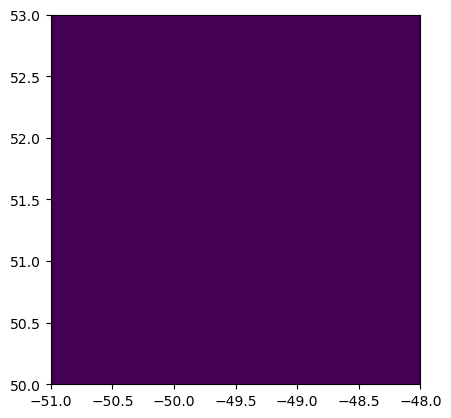

<Axes: >

In [11]:


img=rasterio.open(href)
# Plot the entire raster as an RGB image
show(img)

In [12]:
Land_sub = xr.open_dataset(
    href, engine="rasterio", mask_and_scale=False
)
Land_sub

<xarray.Dataset>
Dimensions:      (band: 1, x: 360, y: 360)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -51.0 -50.99 -50.98 -50.97 ... -48.02 -48.01 -48.0
  * y            (y) float64 53.0 52.99 52.98 52.97 ... 50.03 50.02 50.01 50.0
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) uint8 ...

In [13]:
def find_tile_name(latitude, longitude,sample_bottom_left_lon, sample_bottom_left_lat,tile_size):
    # Define the tile size in degrees (3 degrees in both latitude and longitude)
    offset_lon=sample_bottom_left_lon % tile_size
    offset_lat=sample_bottom_left_lat % tile_size

    
    # longitude=np.sign(longitude)*(abs(longitude)-abs(offset_lon))
    # latitude=np.sign(latitude)*(abs(latitude)-abs(offset_lat))
    
    # Calculate the bottom left corner coordinates of the tile positives only
    bottom_left_lon = (longitude // tile_size) * tile_size
    bottom_left_lat = (latitude // tile_size) * tile_size


    # If offset == 0 then perfect
    if offset_lat == 0:
         bottom_left_lat_final=bottom_left_lat
    if offset_lon == 0:
         bottom_left_lon_final=bottom_left_lon

    if offset_lat != 0 :
         bottom_left_lat_final=bottom_left_lat + offset_lat
         if bottom_left_lat_final > latitude:
              bottom_left_lat_final=bottom_left_lat_final-tile_size
    if offset_lon != 0 :
         bottom_left_lon_final=bottom_left_lon + offset_lon
         if bottom_left_lon_final > longitude:
              bottom_left_lon_final=bottom_left_lon_final-tile_size







    # Generate the tile name using the bottom left corner's coordinates
    tile_name = f"B01_x{bottom_left_lon_final:.1f}_y{bottom_left_lat_final:.1f}"

    return tile_name


In [14]:
# (-44.7//3)*3

In [15]:
import numpy as np
lon_x=178.4
lat_y=63.4

lon_x=-124.1
lat_y=78.17

lon_x=-70.5
lat_y=-14.4

lon_x=7.74
lat_y=-44.7

Sample_left_lon_x=-78
Sample_bottom_lat_y=14
tile_size=3

tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
print(f"The point belongs to the tile: {tile_name}")

The point belongs to the tile: B01_x6.0_y-46.0


In [16]:

lon_x=-77.4253
lat_y= 17.8684

tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
tile_name


'B01_x-78.0_y17.0'

In [17]:
(17//3)*3

15

In [18]:

href=collection.get_item(tile_name).assets["band_data"].href

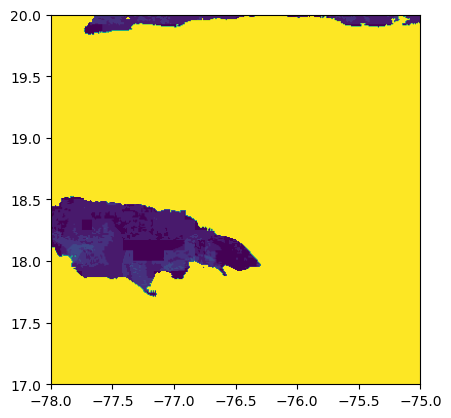

<Axes: >

In [19]:
Land_sub_img=rasterio.open(href)
# Plot the entire raster as an RGB image
show(Land_sub_img)


In [31]:

Land_sub_xr = xr.open_dataset(
    href, engine="rasterio", mask_and_scale=False
)
Land_sub_xr

<xarray.Dataset>
Dimensions:      (band: 1, x: 360, y: 360)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -78.0 -77.99 -77.98 -77.97 ... -75.02 -75.01 -75.0
  * y            (y) float64 20.0 19.99 19.98 19.97 ... 17.03 17.02 17.01 17.0
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) uint8 ...

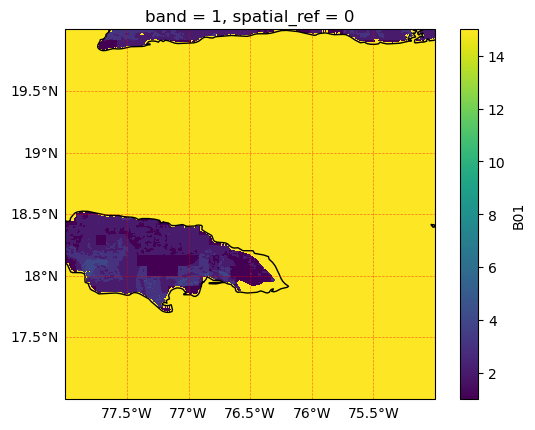

In [32]:
# Create a map projection
ax = plt.axes(projection=ccrs.PlateCarree())

# Plot the variable
Land_sub_xr["band_data"].plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')

# Add features like coastlines, borders, and ocean
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':', edgecolor='black')
# ax.add_feature(cartopy.feature.OCEAN)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.5, color='red', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Set the title
# plt.title('Wave Height')

# Show the plot
plt.show()

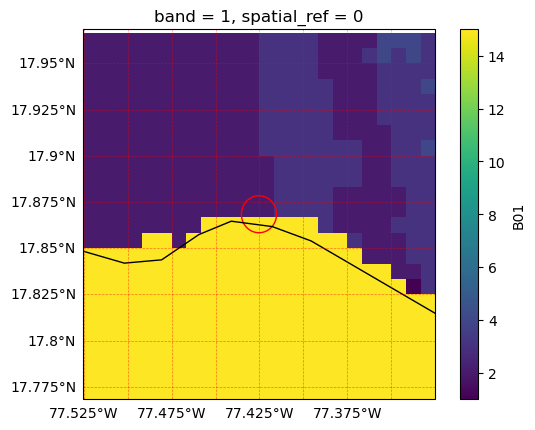

In [33]:
# Create a map projection
ax = plt.axes(projection=ccrs.PlateCarree())

lon_x = -77.4253
lat_y =  17.8684

# # Adjust these values to zoom in or out as needed
lon_min = lon_x -  0.1
lon_max = lon_x +  0.1
lat_min = lat_y +  0.1
lat_max = lat_y -  0.1
ax.set_extent([lon_min, lon_max, lat_min, lat_max])

# Plot the variable
Land_sub_xr["band_data"].sel(x=slice(lon_x-.1,lon_x+.1),y=slice(lat_y+.1,lat_y-.1)).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')

# Add features like coastlines, borders, and ocean
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':', edgecolor='black')
# ax.add_feature(cartopy.feature.OCEAN)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.5, color='red', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Set the title
# plt.title('Wave Height')
# Define the point coordinates


# Create a point geometry
point = Point(lon_x, lat_y)

# Create a GeoDataFrame from the point
gdf = gpd.GeoDataFrame(geometry=[point])

# Add a  1000m buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)

# Plot the GeoDataFrame
# fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()})
gdf.plot(ax=ax, color='none', edgecolor='red')
# Plot the variable


# Show the plot
plt.show()

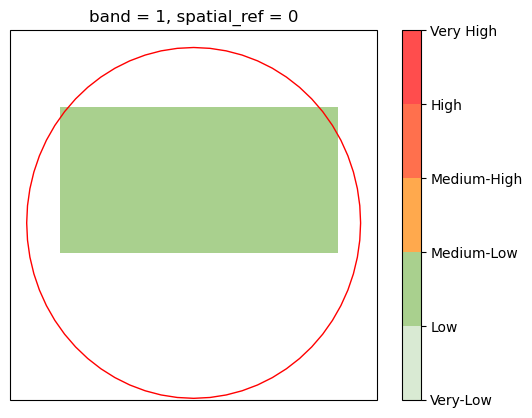

In [34]:
search_square=Land_sub_xr["band_data"].sel(x=slice(lon_x-.01,lon_x+.01),y=slice(lat_y+.01,lat_y-.01))
search_square.values = np.where(search_square.values != 15, search_square.values, np.nan)


colors = ['#D9EAD3', '#A9D08E', '#F9D670', '#FFA94D', '#FF704D', '#FF4D4D']
risk_levels = ['Very-Low', 'Low', 'Medium-Low','Medium-High', 'High', 'Very High'] #very low, low, medium-low, medium-high, high and very high

cmap = mcolors.ListedColormap(colors)

# Create color bar
norm = mcolors.Normalize(vmin=1, vmax=6)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Create a new Axes for the Colorbar
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})

cbar = fig.colorbar(sm, ticks=range(1, 7), ax=ax, boundaries=range(1, 7))
cbar.ax.set_yticklabels(risk_levels)

search_square.plot(ax=ax, cmap=cmap, vmin=1, vmax=6, add_colorbar=False)

point = Point(lon_x, lat_y)

# Create a GeoDataFrame from the point
gdf = gpd.GeoDataFrame(geometry=[point])

# Add a 1000m = 0.01degrees buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)

gdf.plot(ax=ax, color='none', edgecolor='red')  # Create a point geometry

plt.show()

In [35]:
template_df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\All_Datasets\Orig_Datasets\04_Auxillary_files\Arjen_Vector_Template_Jamaica.csv")
template_df.head()

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat
0,BOX_138_171_0,JAM,North America,Jamaica,-76.638993,18.218933,-76.638419,18.227448,-76.637845,18.235963
1,BOX_138_171_1,JAM,North America,Jamaica,-76.645607,18.220463,-76.642730,18.228546,-76.639853,18.236629
2,BOX_138_171_2,JAM,North America,Jamaica,-76.651760,18.223250,-76.646763,18.230341,-76.641766,18.237431
3,BOX_138_171_3,JAM,North America,Jamaica,-76.655492,18.225623,-76.650495,18.232714,-76.645498,18.239804
4,BOX_138_171_4,JAM,North America,Jamaica,-76.660223,18.228769,-76.654210,18.235108,-76.648197,18.241447


In [36]:
template_df["Land_sub"]=np.nan
template_df.head()

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,Land_sub
0,BOX_138_171_0,JAM,North America,Jamaica,-76.638993,18.218933,-76.638419,18.227448,-76.637845,18.235963,NaN
1,BOX_138_171_1,JAM,North America,Jamaica,-76.645607,18.220463,-76.642730,18.228546,-76.639853,18.236629,NaN
2,BOX_138_171_2,JAM,North America,Jamaica,-76.651760,18.223250,-76.646763,18.230341,-76.641766,18.237431,NaN
3,BOX_138_171_3,JAM,North America,Jamaica,-76.655492,18.225623,-76.650495,18.232714,-76.645498,18.239804,NaN
4,BOX_138_171_4,JAM,North America,Jamaica,-76.660223,18.228769,-76.654210,18.235108,-76.648197,18.241447,NaN


In [37]:


Sample_left_lon_x=-78
Sample_bottom_lat_y=14
tile_size=3
nodata_val=15
search_radius=0.01 #Degress=1000m


# for i in tqdm(range(len(template_df["Land_sub"]))[0:3],desc="row number"):
for i in tqdm(range(len(template_df["Land_sub"])),desc="row number"):
    lon_x=template_df.iloc[i,6]
    lat_y=template_df.iloc[i,7]
    # lon_x=-77.4253
    # lat_y= 17.8684



    tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
    tile_name

    href=collection.get_item(tile_name).assets["band_data"].href
    Land_sub_xr = xr.open_dataset(
        href, engine="rasterio", mask_and_scale=False
    )

    search_square=Land_sub_xr["band_data"].sel(x=slice(lon_x-search_radius,lon_x+search_radius),y=slice(lat_y+search_radius,lat_y-search_radius))



    search_square.values = np.where(search_square.values != nodata_val, search_square.values, np.nan)

    # Check if there are any non-NaN values in the array
    if np.isnan(search_square.values).all():
        continue
    else:
        # Compute the mean of non-NaN values and take the ceiling
        transect_land_sub_risk = np.ceil(np.nanmean(search_square.values))
    template_df.iloc[i,10]=transect_land_sub_risk
template_df



row number: 100%|██████████| 1307/1307 [43:17<00:00,  1.99s/it]


,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,Land_sub
0,BOX_138_171_0,JAM,North America,Jamaica,-76.638993,18.218933,-76.638419,18.227448,-76.637845,18.235963,NaN
1,BOX_138_171_1,JAM,North America,Jamaica,-76.645607,18.220463,-76.642730,18.228546,-76.639853,18.236629,NaN
2,BOX_138_171_2,JAM,North America,Jamaica,-76.651760,18.223250,-76.646763,18.230341,-76.641766,18.237431,NaN
3,BOX_138_171_3,JAM,North America,Jamaica,-76.655492,18.225623,-76.650495,18.232714,-76.645498,18.239804,NaN
4,BOX_138_171_4,JAM,North America,Jamaica,-76.660223,18.228769,-76.654210,18.235108,-76.648197,18.241447,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1302,BOX_138_167_49,JAM,North America,Jamaica,-76.560530,18.194318,-76.559530,18.202799,-76.558530,18.211279,NaN
1303,BOX_138_167_50,JAM,North America,Jamaica,-76.565863,18.195194,-76.563949,18.203532,-76.562035,18.211869,NaN
1304,BOX_138_167_51,JAM,North America,Jamaica,-76.571400,18.196737,-76.568248,18.204728,-76.565096,18.212719,NaN
1305,BOX_138_167_52,JAM,North America,Jamaica,-76.576882,18.199248,-76.572277,18.206575,-76.567672,18.213902,NaN


In [38]:
template_df.to_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Land_Subsidence\jamaica_2040.csv",index=False)

In [39]:
template_df.iloc[:,10].describe()

count    578.000000
mean       1.659170
std        0.737526
min        1.000000
25%        1.000000
50%        2.000000
75%        2.000000
max        4.000000
Name: Land_sub, dtype: float64

In [40]:
df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Land_Subsidence\jamaica_2040.csv")
df

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,Land_sub
0,BOX_138_171_0,JAM,North America,Jamaica,-76.638993,18.218933,-76.638419,18.227448,-76.637845,18.235963,NaN
1,BOX_138_171_1,JAM,North America,Jamaica,-76.645607,18.220463,-76.642730,18.228546,-76.639853,18.236629,NaN
2,BOX_138_171_2,JAM,North America,Jamaica,-76.651760,18.223250,-76.646763,18.230341,-76.641766,18.237431,NaN
3,BOX_138_171_3,JAM,North America,Jamaica,-76.655492,18.225623,-76.650495,18.232714,-76.645498,18.239804,NaN
4,BOX_138_171_4,JAM,North America,Jamaica,-76.660223,18.228769,-76.654210,18.235108,-76.648197,18.241447,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1302,BOX_138_167_49,JAM,North America,Jamaica,-76.560530,18.194318,-76.559530,18.202799,-76.558530,18.211279,NaN
1303,BOX_138_167_50,JAM,North America,Jamaica,-76.565863,18.195194,-76.563949,18.203532,-76.562035,18.211869,NaN
1304,BOX_138_167_51,JAM,North America,Jamaica,-76.571400,18.196737,-76.568248,18.204728,-76.565096,18.212719,NaN
1305,BOX_138_167_52,JAM,North America,Jamaica,-76.576882,18.199248,-76.572277,18.206575,-76.567672,18.213902,NaN


In [41]:
import plotly.graph_objects as go

# Define your discrete color scale
color_scale = ['#D9EAD3', '#A9D08E', '#F9D670', '#FFA94D', '#FF704D', '#FF4D4D']

# Create the scatter mapbox plot using Plotly Graph Objects
fig2 = go.Figure(go.Scattermapbox(
    lat=df['Intersect_lat'],
    lon=df['Intersect_lon'],
    mode='markers',
    marker=dict(
        size=10,
        color=df['Land_sub'],  # Use the 'Land_sub' column for color
        colorscale=color_scale,  # Specify the discrete color scale
        cmin=1,  # Set the minimum value for the color scale
        cmax=6,  # Set the maximum value for the color scale
        colorbar=dict(
            title='Land Subsidence risk 2040'  # Set color bar title
        )
    ),
    hoverinfo='text',
    hovertext=df['Land_sub']
))

# Update layout properties
fig2.update_layout(
    title="Land Subsidence Map in Jamaica 2040",
    mapbox_style="carto-positron",
    mapbox=dict(
        zoom=8,
        center=dict(lat=18.1, lon=-77.3)
    ),
    margin=dict(l=0, r=0, b=0, t=50),
)

# Show the plot
fig2.show()
